In [1]:
import pickle
from pymatgen.core import Element
EL = list(map(lambda x:x.name, Element))

file_get = open("../plotting_info_dict.pkl", "rb")
plotting_info_dict = pickle.load(file_get)
file_get.close()
file_get = open("../MOT.pkl", "rb")
MOT = pickle.load(file_get)
file_get.close()

In [2]:
import matplotlib.pyplot as plt
import os
import numpy as np
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from scipy.optimize import curve_fit
from matplotlib.gridspec import GridSpec
import pandas as pd
import re
from multiprocessing import Pool
from multiprocessing.dummy import Pool as ThreadPool
from functools import partial 
import pickle
import time
import math
import sys


def gaussian(x, amplified1, mean1, stddev1, amplified2, mean2, stddev2):
    return amplified1 * np.exp((-(x-mean1)**2)/(2*(stddev1**2))) + amplified2 * np.exp((-(x-mean2)**2)/(2*(stddev2**2)))


def test_r2(x, y, mean1, mean2,step, MIN,MAX):
    bounds = ([0,mean1-0.1*step, 0, 0,mean2-0.1*step, 0], [0.2,mean1+0.1*step,(MAX-MIN)/8,1 ,mean2+0.1*step,(MAX-MIN)/8])
    popt, _ = curve_fit(gaussian, x, y, bounds = bounds)
    y_pred = [gaussian(X,popt[0],popt[1],popt[2],popt[3],popt[4],popt[5]) for X in x]
    y_true = y
    R2 = r2_score(y_true,y_pred)
    RMSQ = mean_squared_error(y_true,y_pred, squared=False)
    return R2,popt,RMSQ,bounds


def s_gaussian(x, amplified1, mean1, stddev1):
    return amplified1 * np.exp((-(x-mean1)**2)/(2*(stddev1**2)))

def s_test_r2(x, y, mean1,step):
    bounds = ([0,mean1-0.1*step, 0], [0.2,mean1+0.1*step, 0.5])
    popt, _ = curve_fit(s_gaussian, x, y, bounds = bounds)
    y_pred = [s_gaussian(X,popt[0],popt[1],popt[2]) for X in x]
    y_true = y
    R2 = r2_score(y_true,y_pred)
    RMSQ = mean_squared_error(y_true,y_pred, squared=False)
    return R2,popt,RMSQ,bounds


def refine_data(Min, Max, step, target_list):
    stations = [round(i,3) for i in np.arange(Min, Max, step)]
    stations.append(round(Max,3))
    
    processed_list = []
    for i in target_list:
        for j in stations:
            if j <= i and i < j + step:
                i = j
                processed_list.append(i)    
    return processed_list


def bond_length_distribution_fitting(ele1, ele2, former_threshold):
    #plot the global bong length and its distribuion.

    try:
        global_data = pd.read_csv("../global_length_csv/bond_of_%s_%s.csv"%(ele1,ele2), header = None)
        refined_data = np.array(pd.read_csv("../redefined_length_csv/bond_of_%s_%s.csv"%(ele1,ele2)).loc[0:]).ravel().tolist()
    except:
        try:
            global_data = pd.read_csv("../global_length_csv/bond_of_%s_%s.csv"%(ele2,ele1), header = None)
            refined_data = np.array(pd.read_csv("../redefined_length_csv/bond_of_%s_%s.csv"%(ele2,ele1)).loc[0:]).ravel().tolist()
        except:
            global_data = []
            refined_data = []
            
    if len(refined_data) != 0:
        fig = plt.figure(figsize=(24,14),dpi=600)
        gs = GridSpec(7,12)
        
        list_of_distance = global_data[0].tolist() #convert data to list
        #the first plot at top left of the top left, the global bondlength.
        ax1 = plt.subplot(gs[:3,:3])
        sorted_list_of_distance = sorted(list_of_distance)
        x_scatter = [i for i in range(len(list_of_distance))]
        ax1.plot(sorted_list_of_distance, x_scatter)
        #ax1.set_title("The Distances between %s and %s."%(ele1,ele2), size = 12)
        plt.ylabel("Enumeration (meaningless)", size = 12, labelpad = 1)
        plt.xlabel("Distance (Å)", size = 12, labelpad = 1)

        #the second plot at top right of the top left, the global length distribution.
        g_2decimal_distance = [round(i, 2) for i in list_of_distance if 0.1 < i]
        g_result = pd.value_counts(g_2decimal_distance)
        g_temp_x = g_result.index.tolist()
        g_temp_y = g_result.values.tolist()
        total_samples = sum(g_temp_y)
        g_temp_xy = [[x,y/total_samples] for x,y in zip(g_temp_x, g_temp_y)]
        g_sorted_xy = sorted(g_temp_xy, key = lambda x:x[0])
        g_x = [g_sorted_xy[l][0] for l in range(len(g_sorted_xy))]
        g_y = [g_sorted_xy[l][1] for l in range(len(g_sorted_xy))]

        ax2 = plt.subplot(gs[0:3, 3:6])
        ax2.plot(g_x, g_y)
        #ax2.set_title("The Distribution of %s and %s Distances."%(ele1,ele2), size = 12)
        plt.xlabel("Length (Å)", size = 12, labelpad = 1)
        plt.ylabel("Proportion (%)", size = 12, labelpad = 1)
        #finish processing the global data
        ###########################################################################################################
        
        list_of_distance = [l for l in refined_data if former_threshold >= l > 0.1] #3.079,4.36

        #the third plot at the left bottom of top left, the refined bond length info. 
        ax3 = plt.subplot(gs[0:3,6:9])
        sorted_list_of_distance = sorted(list_of_distance)
        x_scatter = [i for i in range(len(list_of_distance))]
        ax3.plot(sorted_list_of_distance,x_scatter)
        #ax3.set_title("The Bond Lengths between %s and %s."%(ele1,ele2), size = 12)
        plt.ylabel("Enumeration (meaningless)", size = 12, labelpad = 1)
        plt.xlabel("Distance (Å)", size = 12, labelpad = 1)
        
        #MEAN = sum(list_of_distance)/len(list_of_distance)
        #refined_distance = [round(i, 3) for i in list_of_distance] ##we can add a upper bound of the MEAN+2
        Min, Max = min(list_of_distance), max(list_of_distance)

        Step = round(((Max-Min)/50),3)

        refined_distance = refine_data(Min, Max, Step, list_of_distance)

        result = pd.value_counts(refined_distance)
        temp_x = result.index.tolist()
        temp_y = result.values.tolist()
        total_refined_samples = sum(temp_y)
        temp_xy = [[x,y/total_refined_samples] for x,y in zip(temp_x, temp_y)]
        sorted_xy = sorted(temp_xy, key = lambda x:x[0])
        x = [sorted_xy[l][0] for l in range(len(temp_xy))]
        y = [sorted_xy[l][1] for l in range(len(temp_xy))]

        #the fourth plot at the right bottom of the top left, the length distribution in the first coodinaiton shell.
        ax4 = plt.subplot(gs[0:3,9:12])
        ax4.plot(x,y)
        #ax4.set_title("The Distribution of %s and %s Bond Lengths."%(ele1,ele2), size = 12)
        plt.xlabel("Length (Å)", size = 12, labelpad = 1)
        plt.ylabel("Proportion (%)", size = 12, labelpad = 1)

        #Process the R2 and the RMSQ
        step = Step
        MIN = round(min(x),3) #min(mean1 - 3 * popt[2], mean2 - 3 * popt[5])
        MAX = round(max(x),3) #max(mean1 + 3 * popt[2], mean2 + 3 * popt[5])
    
        np_mean1, np_mean2 = np.arange(MIN, MAX, step),np.arange(MIN, MAX, step)
        dim = len(np_mean1)

        np_R2, np_RMSQ = np.zeros([dim,dim]),np.zeros([dim,dim])
        check_R2_list,check_mean_list = [],[]
        for i, mean1 in enumerate(np_mean1):
            for j, mean2 in enumerate(np_mean2):
                if i < j:
                    try:
                        R2,popt,RMSQ,bounds = test_r2(x, y, mean1, mean2, step, MIN,MAX)
                        R2 = 0 if R2 < 0 else R2
                        np_R2[i][j] = R2
                        np_R2[j][i] = R2
                        np_RMSQ[i][j] = RMSQ
                        np_RMSQ[j][i] = RMSQ
                        check_R2_list.append(R2)
                        check_mean_list.append([mean1,mean2])
                    except:
                        np_R2[i][j] = 0
                        np_R2[j][i] = 0
                        np_RMSQ[i][j] = max(np_RMSQ.flat)
                        np_RMSQ[j][i] = max(np_RMSQ.flat)
                if i == j:
                    try:
                        R2,popt,RMSQ,bounds = test_r2(x, y, mean1, mean2, step, MIN,MAX)
                        R2 = 0 if R2 < 0 else R2
                        np_R2[i][j] = R2
                        np_RMSQ[i][j] = RMSQ
                        check_R2_list.append(R2)
                        check_mean_list.append([mean1,mean2])
                    except:
                        np_R2[i][j] = 0
                        np_RMSQ[i][j] = max(np_RMSQ.flat)  
        best_mean_combo = [j for i,j in zip(check_R2_list, check_mean_list) if i == max(check_R2_list)][0]
        mean1, mean2 = best_mean_combo[0], best_mean_combo[1]
        R2,popt,RMSQ,bounds = test_r2(x,y,mean1, mean2, step, MIN,MAX)
        
        #the fifth plot at the top right, the R2 score info.
        ax5 = fig.add_subplot(gs[3:7, 0:4])
        ax5.contourf(np_mean1, np_mean2, np_R2,20, cmap="plasma")
        #ax5.set_title("The R2 Scores of the mean values.", size = 16)
        plt.xlabel("Mean1 (Å)", size = 18, labelpad = 2)
        plt.ylabel("Mean2 (Å)", size = 18, labelpad = 2)

        #the sixth plot at the left bottom, the RMSQ info.
        ax6 = fig.add_subplot(gs[3:7, 4:8])
        ax6.contourf(np_mean1, np_mean2, np_RMSQ,20, cmap="plasma")
        #ax6.set_title("The RMSQ of the mean values.", size = 16)
        plt.xlabel("Mean1 (Å)", size = 18, labelpad = 2)
        plt.ylabel("Mean2 (Å)", size = 18, labelpad = 2)

        #the seventh plot at the bottom right, the fitting plots.
        x_perf = np.arange(MIN,MAX, 0.001)
        y_perf = [gaussian(X, popt[0], popt[1], popt[2], popt[3], popt[4], popt[5]) for X in x_perf]
        x_orig = [sorted_xy[l][0] for l in range(len(temp_xy)) if MIN<sorted_xy[l][0]<MAX]
        y_orig = [sorted_xy[l][1] for l in range(len(temp_xy)) if MIN<sorted_xy[l][0]<MAX]
        ax7 = plt.subplot(gs[3:7, 8:12])
        ori, = ax7.plot(x_orig,y_orig)
        gau, = ax7.plot(x_perf,y_perf, c="red")
        ax7.legend(handles=[ori,gau],labels=['Original_Line','Gaussian_Fitting_line'],loc = "upper right", fontsize = 16)
        ax7.axvline(x=popt[1], color='black', linestyle='--')
        ax7.axvline(x=popt[4], color='black', linestyle='--')
        #ax7.set_title("The Fitting Curve and the Original Distribution.", size = 16)
        ax7.set_xlim([min(np_mean1),max(np_mean2)])
        plt.xlabel("Distance (Å)", size = 18, labelpad = 4)
        plt.ylabel("Proportion (%)", size = 18, labelpad = 4)
        threshold = round(max(popt[1] + 4 * popt[2], popt[4] + 4 * popt[5]),3)
        #plt.suptitle("The Threshold between %s and %s should be %sÅ."%(ele1, ele2,threshold), size = 36)
        #fig.text(s='mean_1 = %s, sigma_1 = %s, mean_2 = %s, sigma_2 = %s'%(round(popt[1],3),round(popt[2],3),round(popt[4],3),round(popt[5],3)),
                    #x=0.5, y=0.92, fontsize=12, ha='center', va='center')
        plt.subplots_adjust(wspace=1.2, hspace=1.2)
        parameters = [(ele1, ele2), {"R2":max(check_R2_list), "mean_1":round(popt[1],3), "sigma_1": round(popt[2],3), 
                                                              "mean_2":round(popt[4],3), "sigma_2": round(popt[5],3),
                                                              "threshold":threshold}]
        plt.savefig("D:/share/ppt/Threshold of %s and %s.svg"%(ele1,ele2), bbox_inches='tight')
        plt.savefig("D:/share/ppt/Threshold of %s and %s.png"%(ele1,ele2), bbox_inches='tight')
        plt.show()
        return parameters

In [3]:
ele1,ele2 = "O","Al"
para = bond_length_distribution_fitting(ele1, ele2, MOT[-1][EL.index(ele1)][EL.index(ele2)])

In [4]:
import pickle
import pandas as pd
import numpy as np

element_list = ['H', 'He', 'Li', 'Be', 'B', 'C', 'N', 'O', 'F', 'Ne', 'Na', 'Mg', 'Al', 'Si', 'P', 'S', 'Cl', 'Ar', 
                ' K', 'Ca', 'Sc', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Ga', 'Ge', 'As', 'Se', 'Br',
                'Kr', 'Rb', 'Sr', 'Y', 'Zr', 'Nb', 'Mo', 'Tc', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn', 'Sb', 'Te', 
                'I', 'Xe', 'Cs', 'Ba', 'Hf', 'Ta', 'W', 'Re', 'Os', 'Ir', 'Pt', 'Au', 'Hg', 'Tl', 'Pb', 'Bi', 'Po', 
                'At', 'Rn', 'Fr', 'Ra', 'Rf', 'Db', 'Sg', 'Bh', 'Hs', 'Mt', 'Ds', 'Rg', 'Cn', 'Nh', 'Fl', 'Mc', 'Lv',
                'Ts', 'Og', 'La', 'Ce', 'Pr', 'Nd', 'Pm', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb', 'Lu', 
                'Ac', 'Th', 'Pa', 'U', 'Np', 'Pu', 'Am', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Md', 'No', 'Lr']

openexcel = pd.read_excel('../pre_set.xlsx', sheet_name = "Radii_X") 
radii_dict = openexcel.set_index("symbol").to_dict()["single"]

file_get = open("../fitting_info_dict.pkl", "rb")
fitting_info_dict = pickle.load(file_get)
file_get.close()

R2 = sorted(list(map(lambda x:x["R2"],list(fitting_info_dict.values()))), reverse=False)
threshold = sorted(list(map(lambda x:((radii_dict[x[0]]+radii_dict[x[1]])*0.01,fitting_info_dict[x]["threshold"]),list(fitting_info_dict.keys()))), reverse=False)

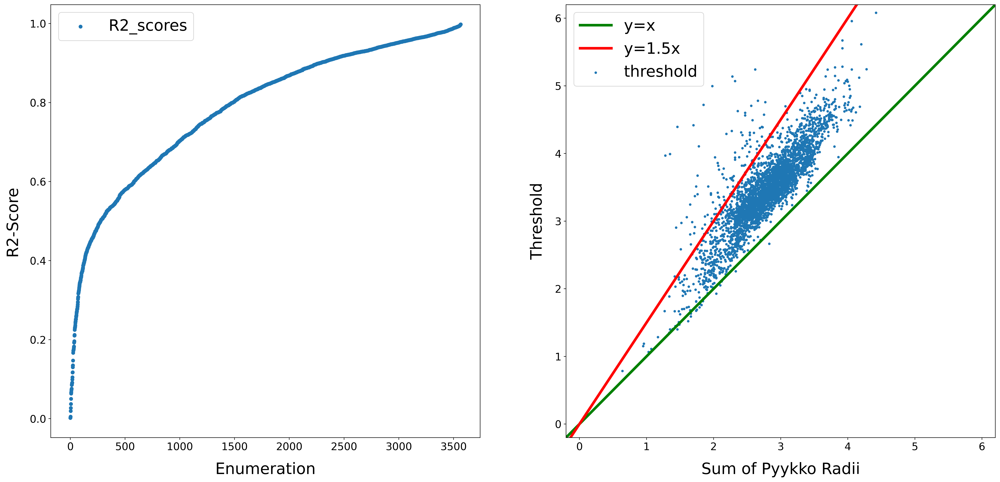

In [5]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
fig = plt.figure(figsize=(26,12),dpi=400)
gs = GridSpec(1,2)
fontsize = 24

#########################################################
ax1 = fig.add_subplot(gs[:1,:1])
ax2 = fig.add_subplot(gs[:1,1:2])

line1 = ax1.scatter([i for i in range(len(R2))], R2 , marker="o", s=fontsize, label="R2_scores")
#line2 = ax1.scatter([i for i in range(len(OQMD_R2))], OQMD_R2, marker="*", s=fontsize, color="blue", label="OQMD")

ax1.set_xlabel("Enumeration", fontsize=fontsize,labelpad=15)
ax1.set_ylabel("R2-Score",fontsize=fontsize,labelpad=15)

ax1.tick_params(labelsize=fontsize-8)

lines = [line1]
labs = [l.get_label() for l in lines]
ax1.legend(lines, labs, loc=0, fontsize=fontsize)
########################################################

line3 = ax2.plot([-1,7], [-1,7], color="green", label="y=x", linewidth=fontsize-16-4)
line4 = ax2.plot([-1,7], [-1*1.5,7*1.5], color="red", label="y=1.5x", linewidth=fontsize-16-4)
line5 = ax2.scatter([i[0] for i in threshold],[i[1] for i in threshold], marker="o", s=fontsize-16, label="threshold")
#line6 = ax2.scatter([i[0] for i in OQMD_threshold],[i[1] for i in OQMD_threshold], marker="*", s=fontsize-16, color="blue", label="OQMD", alpha=0.3)

ax2.set_xlabel("Sum of Pyykko Radii", fontsize=fontsize,labelpad=15)
ax2.set_ylabel("Threshold",fontsize=fontsize,labelpad=15)
ax2.set_xlim([-0.2, 6.2])
ax2.set_ylim([-0.2, 6.2])

ax2.tick_params(labelsize=fontsize-8)

lines = [line3[0], line4[0], line5]
labs = [l.get_label() for l in lines]
ax2.legend(lines, labs, loc=0, fontsize=fontsize)

#fig.savefig("Thresholds.svg",bbox_inches="tight")
plt.show()

In [6]:
"""
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

element_list = ['H', 'He', 'Li', 'Be', 'B', 'C', 'N', 'O', 'F', 'Ne', 'Na', 'Mg', 'Al', 'Si', 'P', 'S', 'Cl', 'Ar', 
                ' K', 'Ca', 'Sc', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Ga', 'Ge', 'As', 'Se', 'Br',
                'Kr', 'Rb', 'Sr', 'Y', 'Zr', 'Nb', 'Mo', 'Tc', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn', 'Sb', 'Te', 
                'I', 'Xe', 'Cs', 'Ba', 'Hf', 'Ta', 'W', 'Re', 'Os', 'Ir', 'Pt', 'Au', 'Hg', 'Tl', 'Pb', 'Bi', 'Po', 
                'At', 'Rn', 'Fr', 'Ra', 'Rf', 'Db', 'Sg', 'Bh', 'Hs', 'Mt', 'Ds', 'Rg', 'Cn', 'Nh', 'Fl', 'Mc', 'Lv',
                'Ts', 'Og', 'La', 'Ce', 'Pr', 'Nd', 'Pm', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb', 'Lu', 
                'Ac', 'Th', 'Pa', 'U', 'Np', 'Pu', 'Am', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Md', 'No', 'Lr']

file_get = open("../fitting_info_dict.pkl", "rb")
fitting_info_dict = pickle.load(file_get)
file_get.close()
"""

In [6]:
s = 0
for k,v in fitting_info_dict.items():
    if k[0] == k[1]:
        mean = max(v["mean_1"], v["mean_2"])
        if mean == v["mean_1"]:
            sigma = v["sigma_1"]
        else:
            sigma = v["sigma_2"]
        exec("%s=[mean, sigma]"%k[0])

rare_element_list = []
for ele in element_list:
    try:
        exec("mean  = %s[0]"%ele)
    except:
        rare_element_list.append(ele)


candi_dict = {}
for ele in rare_element_list:
    candi = []
    for k,v in fitting_info_dict.items():
        if ele in k:
            candi.append((k, v["R2"]))
    if len(candi) > 0:
        chosen_one = sorted(candi, key = lambda x:x[1])[-1]
        candi_dict[ele] = chosen_one

processed_ele = []
for k,v in candi_dict.items():
    info = fitting_info_dict[v[0]]
    mean = max(info["mean_1"], info["mean_2"])
    if mean == info["mean_1"]:
        sigma = info["sigma_1"]
    else:
        sigma = info["sigma_2"]
    if len(set(v[0])) == 1:
        exec("%s=[mean, sigma]"%k)
        processed_ele.append(k)
    else:
        key = list(v[0])
        key.remove(k)
        exec("B_mean = %s[0]"%key[0])
        exec("B_sigma = %s[1]"%key[0])
        if mean>B_mean and sigma>B_sigma:
            Mean = mean - B_mean
            Sigma = (mean**2 - B_mean**2)**(0.5)
            exec("%s=[Mean, Sigma]"%k)
            processed_ele.append(k)
rest = set(rare_element_list).difference(set(processed_ele))

for ele in rest:
    exec("%s=[0.0, 0.0]"%ele)

In [7]:
name = np.array(["H"   , "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "He"  , 
                 "Li"  , "Be"  , "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "B"   , "C"   , "N"   , "O",    "F"   , "Ne"  ,
                 "Na"  , "Mg"  , "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "Al"  , "Si"  , "P"   , "S"   , "Cl"  , "Ar"  , 
                 " K"  , "Ca"  , "Sc"  , "Ti"  , "V"   , "Cr"  , "Mn"  , "Fe"  , "Co"  , "Ni"  , "Cu"  , "Zn"  , "Ga"  , "Ge"  , "As"  , "Se"  , "Br"  , "Kr"  ,
                 "Rb"  , "Sr"  , "Y"   , "Zr"  , "Nb"  , "Mo"  , "Tc"  , "Ru"  , "Rh"  , "Pd"  , "Ag"  , "Cd"  , "In"  , "Sn"  , "Sb"  , "Te"  , "I"   , "Xe"  , 
                 "Cs"  , "Ba"  , "None", "Hf"  , "Ta"  , "W"   , "Re"  , "Os"  , "Ir"  , "Pt"  , "Au"  , "Hg"  , "Tl"  , "Pb"  , "Bi"  , "Po"  , "At"  , "Rn",
                 "Fr"  , "Ra"  , "None", "Rf"  , "Db"  , "Sg"  , "Bh"  , "Hs"  , "Mt"  , "Ds"  , "Rg"  , "Cn"  , "Nh"  , "Fl"  , "Mc"  , "Lv"  , "Ts"  , "Og",
                 "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None", "None",
                 "None", "None", "La"  , "Ce"  , "Pr"  , "Nd"  , "Pm"  , "Sm"  , "Eu"  , "Gd"  , "Tb"  , "Dy"  , "Ho"  , "Er"  , "Tm"  , "Yb"  , "Lu"  , "None",
                 "None", "None", "Ac"  , "Th"  , "Pa"  , "U"   , "Np"  , "Pu"  , "Am"  , "Cm"  , "Bk"  , "Cf"  , "Es"  , "Fm"  , "Md"  , "No"  , "Lr"  , "None"])


mean = np.array([ H[0]*50,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,He[0]*50, 
                 Li[0]*50,Be[0]*50,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0, B[0]*50, C[0]*50, N[0]*50,O[0]* 50, F[0]*50,Ne[0]*50,
                 Na[0]*50,Mg[0]*50,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,Al[0]*50,Si[0]*50, P[0]*50,S[0]* 50,Cl[0]*50,Ar[0]*50, 
                  K[0]*50,Ca[0]*50,Sc[0]*50,Ti[0]*50, V[0]*50,Cr[0]*50,Mn[0]*50,Fe[0]*50,Co[0]*50,Ni[0]*50,Cu[0]*50,Zn[0]*50,Ga[0]*50,Ge[0]*50,As[0]*50,Se[0]*50,Br[0]*50,Kr[0]*50,
                 Rb[0]*50,Sr[0]*50, Y[0]*50,Zr[0]*50,Nb[0]*50,Mo[0]*50,Tc[0]*50,Ru[0]*50,Rh[0]*50,Pd[0]*50,Ag[0]*50,Cd[0]*50,In[0]*50,Sn[0]*50,Sb[0]*50,Te[0]*50, I[0]*50,Xe[0]*50, 
                 Cs[0]*50,Ba[0]*50,     0.0,Hf[0]*50,Ta[0]*50, W[0]*50,Re[0]*50,Os[0]*50,Ir[0]*50,Pt[0]*50,Au[0]*50,Hg[0]*50,Tl[0]*50,Pb[0]*50,Bi[0]*50,Po[0]*50,At[0]*50,Rn[0]*50,
                 Fr[0]*50,Ra[0]*50,     0.0,Rf[0]*50,Db[0]*50,Sg[0]*50,Bh[0]*50,Hs[0]*50,Mt[0]*50,Ds[0]*50,Rg[0]*50,Cn[0]*50,Nh[0]*50,Fl[0]*50,Mc[0]*50,Lv[0]*50,Ts[0]*50,Og[0]*50,
                      0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,     0.0,      0.0,     0.0,     0.0,     0.0,     0.0,
                      0.0,     0.0,La[0]*50,Ce[0]*50,Pr[0]*50,Nd[0]*50,Pm[0]*50,Sm[0]*50,Eu[0]*50,Gd[0]*50,Tb[0]*50,Dy[0]*50,Ho[0]*50,Er[0]*50,Tm[0]*50,Yb[0]*50,Lu[0]*50,     0.0,
                      0.0,     0.0,Ac[0]*50,Th[0]*50,Pa[0]*50, U[0]*50,Np[0]*50,Pu[0]*50,Am[0]*50,Cm[0]*50,Bk[0]*50,Cf[0]*50,Es[0]*50,Fm[0]*50,Md[0]*50,No[0]*50,Lr[0]*50,     0.0])

sigma = np.array([ H[1] * 50,0.0,   0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,He[1] * 50, 
                  Li[1] * 50,Be[1] * 50,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0, B[1] * 50, C[1] * 50, N[1] * 50, O[1] * 50, F[1] * 50,Ne[1] * 50,
                  Na[1] * 50,Mg[1] * 50,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,Al[1] * 50,Si[1] * 50, P[1] * 50, S[1] * 50,Cl[1] * 50,Ar[1] * 50, 
                   K[1] * 50,Ca[1] * 50,Sc[1] * 50,Ti[1] * 50, V[1] * 50,Cr[1] * 50,Mn[1] * 50,Fe[1] * 50,Co[1] * 50,Ni[1] * 50,Cu[1] * 50,Zn[1] * 50,Ga[1] * 50,Ge[1] * 50,As[1] * 50,Se[1] * 50,Br[1] * 50,Kr[1] * 50,
                  Rb[1] * 50,Sr[1] * 50, Y[1] * 50,Zr[1] * 50,Nb[1] * 50,Mo[1] * 50,Tc[1] * 50,Ru[1] * 50,Rh[1] * 50,Pd[1] * 50,Ag[1] * 50,Cd[1] * 50,In[1] * 50,Sn[1] * 50,Sb[1] * 50,Te[1] * 50, I[1] * 50,Xe[1] * 50, 
                  Cs[1] * 50,Ba[1] * 50,       0.0,Hf[1] * 50,Ta[1] * 50, W[1] * 50,Re[1] * 50,Os[1] * 50,Ir[1] * 50,Pt[1] * 50,Au[1] * 50,Hg[1] * 50,Tl[1] * 50,Pb[1] * 50,Bi[1] * 50,Po[1] * 50,At[1] * 50,Rn[1] * 50,
                  Fr[1] * 50,Ra[1] * 50,       0.0,Rf[1] * 50,Db[1] * 50,Sg[1] * 50,Bh[1] * 50,Hs[1] * 50,Mt[1] * 50,Ds[1] * 50,Rg[1] * 50,Cn[1] * 50,Nh[1] * 50,Fl[1] * 50,Mc[1] * 50,Lv[1] * 50,Ts[1] * 50,Og[1] * 50,
                         0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,       0.0,        0.0,      0.0,       0.0,       0.0,       0.0,       0.0,        0.0,
                         0.0,       0.0,La[1] * 50,Ce[1] * 50,Pr[1] * 50,Nd[1] * 50,Pm[1] * 50,Sm[1] * 50,Eu[1] * 50,Gd[1] * 50,Tb[1] * 50,Dy[1] * 50,Ho[1] * 50,Er[1] * 50,Tm[1] * 50,Yb[1] * 50,Lu[1] * 50,        0.0,
                         0.0,       0.0,Ac[1] * 50,Th[1] * 50,Pa[1] * 50, U[1] * 50,Np[1] * 50,Pu[1] * 50,Am[1] * 50,Cm[1] * 50,Bk[1] * 50,Cf[1] * 50,Es[1] * 50,Fm[1] * 50,Md[1] * 50,No[1] * 50,Lr[1] * 50,        0.0])

color = np.array(["gr",  0.0, 0.0,  0.0,   0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0, 0.0,   0.0,  0.0,  0.0,  0.0, "gr", 
                  "bl", "bl", 0.0,  0.0,   0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0, "bl", "bl", "gr", "gr", "gr", "gr",
                  "bl", "bl", 0.0,  0.0,   0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0, "bl", "bl", "bl", "bl", "gr", "gr", 
                  "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "gy", "gr",
                  "bl", "bl", "bl", "bl", "bl", "bl", "pr", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "gr", 
                  "bl", "bl",  0.0, "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "gy", "bl", "bl", "bl", "bl", "bl", "gr",
                  "bl", "bl",  0.0, "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "gr",
                   0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0,  0.0  ,0.0,  0.0,  0.0, 0.0,   0.0,  0.0,
                   0.0,  0.0, "bl", "bl", "bl", "bl", "pr", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl", "bl",  0.0,
                   0.0,  0.0, "bl", "bl", "bl", "bl", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr", "pr",  0.0])


color_dict = {"Mean":{"gr":"#ffa400","pr":"#00bc12","bl":"#4b5cc4","gy":"#808080","none":"#392f41"},
             "Sigma":{"gr":"#ff8936","pr":"#bce672","bl":"#44cef6","gy":"#c2ccd0","none":"#392f41"},
              "html":{"gr":"#FFFFE0","pr":"#D8BFD8","bl":"#ADD8E6","gy":"#D3D3D3","none":"#D3D3D3"}}


mean_color = list(map(lambda x:color_dict["Mean"][x], list(map(lambda x:x if x!="0.0" else "none", color))))
sigma_color = list(map(lambda x:color_dict["Sigma"][x], list(map(lambda x:x if x!="0.0" else "none", color))))
html_color = list(map(lambda x:color_dict["html"][x], list(map(lambda x:x if x!="0.0" else "none", color))))

#data = np.vstack((name, mean,sigma,np.array(mean_color),np.array(sigma_color))).T
#columns = ["symbol", "mean", "sigma", "mc", "sc"]
#df = pd.DataFrame(data, columns=columns)
#df.to_csv("/3dPT_info_test.csv", header = columns , index = None)


In [9]:
def custom_format(d):
    return '{' + ', '.join(f"{k}: '{v}'" if isinstance(v, str) else f"{k}: {v}" for k, v in d.items()) + '},'

elements_const = []
for i,e in enumerate(name):
    if e != 'None':
        edict = {}
        edict["symbel"] = e
        edict["position"] = i+1
        edict["radius"] = "%.2f"%mean[i] if mean[i]==0 else "No Data"
        edict["sigma"] = "%.2f"%sigma[i] if sigma[i] else ""
        edict["color"] = sigma_color[i]
        elements_const.append(edict)
#for edict in elements_const:
    #print(custom_format(edict))
#print(custom_format(elements_const[9]))

In [20]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(54, 30), dpi=600, facecolor="white")

# Adjust the space between plots
gs = gridspec.GridSpec(10, 18, wspace=0.05, hspace=0.05) 
fig.tight_layout(pad=0)

plt.axis('off')
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

for i in range(10*18):
    if name[i] == "None":
        c,t = "white", "None"
    else:
        c,t = html_color[i], name[i]
        if sigma[i] > 0.0:
            U = "%.3f"%mean[i]
            B = "(" + "%.3f"%sigma[i] + ")"
        else:
            U,B = "No data", "no data"
    i += 1
    ax = fig.add_subplot(gs[i-1])  # Use gridspec here
    ax.patch.set_facecolor(c)
    ax.set(xlim=[0, 1], ylim=[0, 1], xticks=[], yticks=[])
    for spine in ['right', 'top', 'left', 'bottom']: ax.spines[spine].set_visible(False)
        
    if t != "None":
        if U != "No data":
            ax.text(x=0.5, y=0.35, s=t, fontsize=60, ha='center', fontweight='bold')
            #ax.text(x=0.5, y=0.3, s=U, fontsize=36, ha='center')
            #ax.text(x=0.5, y=0.1, s=B, fontsize=27, ha='center')
        else:
            ax.text(x=0.5, y=0.35, s=t, fontsize=60, ha='center', fontweight='bold')
            #ax.text(x=0.5, y=0.2, s=U, fontsize=36, ha='center')

# No need for plt.savefig here, but you can uncomment it if you're saving the figure
plt.savefig("D:/share/PPT/periodic_table.svg")
plt.savefig("D:/share/PPT/periodic_table.png")
#plt.show()

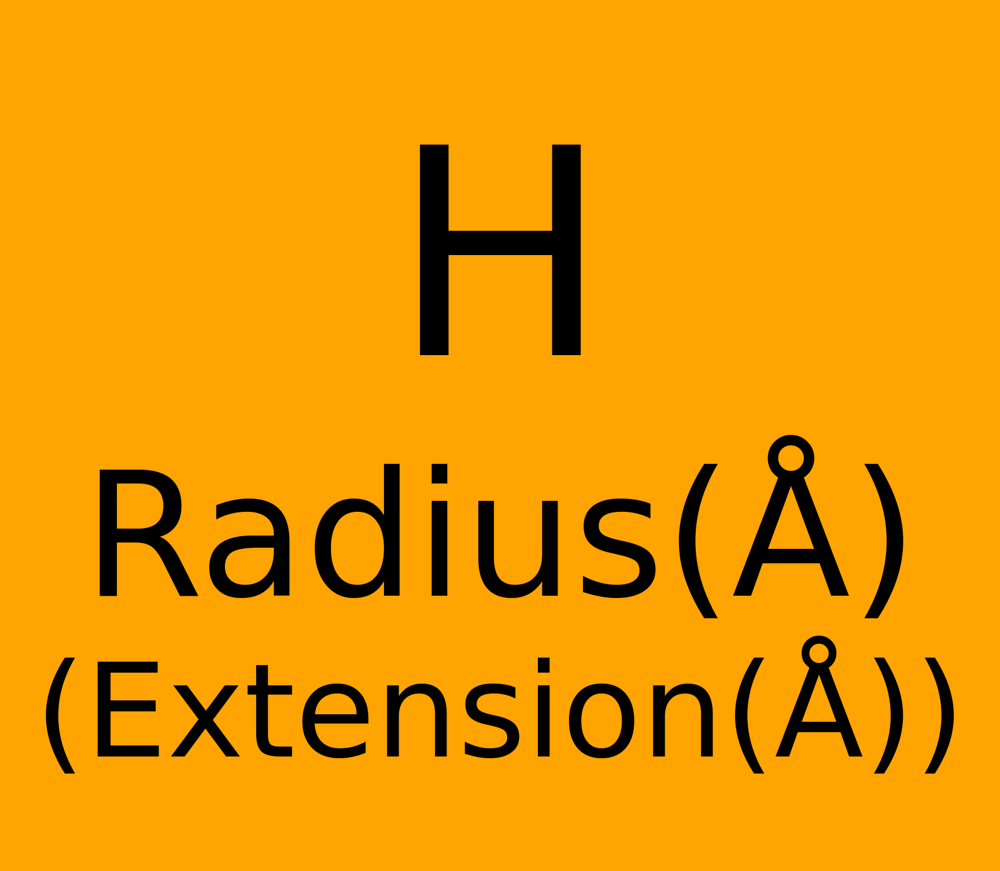

In [12]:
fig = plt.figure(figsize=(3, 3), dpi=600, facecolor="#ffa400")
fig.tight_layout(pad=0)
ex = fig.add_subplot(111, facecolor="#ffa400")  # Adding an Axes object to the figure

ex.set(xlim=[0, 1], ylim=[0, 1], xticks=[], yticks=[])
for spine in ['right', 'top', 'left', 'bottom']: ex.spines[spine].set_visible(False)

ex.text(x=0.5, y=0.6, s="H", fontsize=60, ha='center')
ex.text(x=0.5, y=0.3, s="Radius(Å)", fontsize=36, ha='center')
ex.text(x=0.5, y=0.1, s="(Extension(Å))", fontsize=27, ha='center')
plt.savefig("D:/share/PPT/Legend_H.svg")
plt.savefig("D:/share/PPT/Legend_H.png")

In [71]:
assert 1==2

AssertionError: 

In [11]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

def barcharts3d_fromarray(x_df, y_df, z_df,step=1):
        global sdf
        global mcdf,scdf
        z_min,x_min,y_min = 0,0,0
        mesh_list,ann = [],[]

        len_x_df = len(x_df)
        len_y_df = len(y_df)
        for idx, y_data in enumerate(x_df):
            for idx2, x_data in enumerate(y_df):
                x_max = x_min + step
                y_max = y_min + step
                IDX = idx2 + idx * len_y_df
                z_max = z_df[IDX]  #find the position of the 
                if z_max != 0:
                    mesh_list.append(
                        go.Mesh3d(
                            x=[x_min, x_min, x_max, x_max, x_min, x_min, x_max, x_max],
                            y=[y_min, y_max, y_max, y_min, y_min, y_max, y_max, y_min],
                            z=[z_min, z_min, z_min, z_min, z_max, z_max, z_max, z_max],
                            color=mcdf[IDX],
                            alphahull = 0,
                            #intensity = [0,0,0,0,z_max,z_max,z_max,z_max],
                            opacity=1,
                            flatshading=True,
                            #hovertext='text',
                            hoverinfo='skip',
                            ))
                    Z_min = z_max
                    Z_max = z_max + sdf[IDX]*3

                    mesh_list.append(
                        go.Mesh3d(
                            x=[x_min, x_min, x_max, x_max, x_min, x_min, x_max, x_max],
                            y=[y_min, y_max, y_max, y_min, y_min, y_max, y_max, y_min],
                            z=[Z_min, Z_min, Z_min, Z_min, Z_max, Z_max, Z_max, Z_max],
                            color=scdf[IDX],
                            alphahull = 0,
                            #intensity = [z_max,z_max,z_max,z_max,0,0,0,0],
                            opacity=1,
                            flatshading=True,
                            hovertext='text',
                            hoverinfo='skip',))
                    ann.append(dict(
                        showarrow = False,
                        x = (x_min+x_max)/2,
                        y = (y_min+y_max)/2,
                        z = Z_max,
                        text = symbol[IDX],
                        font = dict(color="black", size= 16),
                        #bgcolor = 'rgba(0,0,0,0.3)',
                        xanchor = 'center', yanchor = "middle",
                        hovertext = "Radius: %sÅ  Width: %sÅ"%(round(zdf[IDX],2),round(sdf[IDX]*3,2))))
                else:None
                y_min += 2 * step
            x_min += 2 * step
            y_min = 0
        x_min = 0
        
        y_legend = [str(y_ax) for y_ax in y_df]
        x_legend = [str(x_ax) for x_ax in x_df]
        z_legend = None

        fig = go.Figure(mesh_list)

        fig.update_layout(width=1600, height=1200,template= "plotly_white", 
                          title=dict(text = "The Maximum Coordination Radii with Width",x=0.5,font=dict(size = 54)),
                          scene=dict(
            yaxis=dict(showgrid=False, showticklabels=False,
                tickmode='array',
                ticktext=y_legend,
                tickvals=np.arange(y_min, len_y_df*2, 2*step),
                title=dict(text = "Group",font=dict(size = 24))),
            xaxis=dict(showgrid=False, showticklabels=False,
                tickmode='array',
                ticktext=x_legend,
                tickvals=np.arange(x_min, len_x_df*2, 2*step),
                title=dict(text = "Period",font=dict(size = 24))),
            zaxis=dict(showgrid=False, showticklabels=False,
                tickmode='array',
                ticktext=z_legend,
                title=dict(text = "Coordination Radii",font=dict(size = 24))),
            aspectratio=dict(x=8, y=18, z=4),
            annotations = ann))
        return fig


xdf = pd.Series([i for i in range(10)])
ydf = pd.Series([i for i in range(18)])
#data_df = pd.read_csv("D:/share/ML for CoreLevel/3dPT_info.csv")
data_df = df
symbol = data_df["symbol"]
zdf = data_df["mean"]
zdf = list(map(float, zdf))
sdf = data_df["sigma"]
sdf = list(map(float, sdf))
mcdf = data_df["mc"]
scdf = data_df["sc"]
fig = barcharts3d_fromarray(xdf, ydf, zdf)
fig.write_html("../Coordination Radii of Elements.html")
fig.show()

In [13]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import pandas as pd
import matplotlib.pyplot as plt
import math

result = {}
for name in ["GCN_w","GCN_s","GAT_w","GAT_s","AFP_w","AFP_s","MPNN_w","MPNN_s"]:
    df = pd.read_csv("../models/TOSS_%s.txt"%name, header=None, 
                 names=["epoch","cost","tr_ROC","tr_PRC","tr_ACC","vl_ROC","vl_PRC","vl_ACC","te_ROC","te_PRC","te_ACC",])
    time_cost = round(sum(list(df["cost"])[0:-31]))
    vl_ACC = list(df["vl_ACC"])[-32]
    result.update({name:[time_cost, vl_ACC]})
    
ML_models = {"RF_w":[264,35.10],"RF_s":[32,57.37], "XGB_w":[1261,32.00],"XGB_s":[12462,28.36]}
result.update(ML_models)
parameters_space = {"GCN_w":15695,"GCN_s":422993,"GAT_w":1107025,"GAT_s":3220565,"AFP_w":65423,"AFP_s":1868625,"MPNN_w":297678,"MPNN_s":2224462}
list(map(lambda x:result[x].append(parameters_space[x]),list(parameters_space.keys())))

df = pd.DataFrame(result.values(), columns=["Cost", "Acc", "Vol"])

In [14]:
fontsize = 24

x = [i*3 for i in range(12)]
width = 1
fig = plt.figure(figsize=(32,24),dpi=400)
gs = GridSpec(12,16)

ax1 = fig.add_subplot(gs[:6,:16])
ax2 = fig.add_subplot(gs[:6,:16], frame_on = False)

line1 = ax1.bar(x, df["Acc"], width=width, label="Accuracy", color = "blue")
line2 = ax2.bar([i+1 for i in x], [i/3600 for i in df["Cost"]], width=width, label="Time Cost(hours)", color = "red")

ax1.yaxis.tick_left()
ax1.yaxis.set_label_position('left')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position('right')

ax1.set_xticks([i+0.5 for i in x],
               ["GCN_w","GCN_s","GAT_w","GAT_s","AFP_w","AFP_s","MPNN_w","MPNN_s","RF_w","RF_s","XGB_w","XGB_s"],fontsize=fontsize)
ax2.set_xticks([])
ax1.set_ylabel("Accuracy",fontsize=fontsize,labelpad=0)
ax1.set_ylim([0,120])
ax2.set_ylabel('Time Cost(hours)',fontsize=fontsize,labelpad=30)

ax1.set_yticks([i for i in range(0,120,20)], [i for i in range(0,120,20)], fontsize=fontsize)
ax2.set_yticks([i for i in range(0,30,5)],[i for i in range(0,30,5)], fontsize=fontsize)

ax1.set_xlim([-1.5,35.5])
ax2.set_xlim([-1.5,35.5])

lines = [line1, line2]
labs = [l.get_label() for l in lines]
ax1.legend(lines, labs, loc=0, fontsize=fontsize)

##############################################################################

ax3 = fig.add_subplot(gs[6:12,0:10])
x = [i*2 for i in range(8)]
width = 1

line3 = ax3.bar(x, [math.log10(i) for i in list(df["Vol"])[0:-4]], width=width, label="Number of Coeffient (log10)", color = "green")

ax3.set_xticks(x, ["GCN_w","GCN_s","GAT_w","GAT_s","AFP_w","AFP_s","MPNN_w","MPNN_s"],fontsize=fontsize)
ax3.set_ylabel("Number of Coeffient (log10)", fontsize=fontsize,labelpad=30)
ax3.set_yticks([i for i in range(7)],[i for i in range(7)], fontsize=fontsize)

#lines = [line3]
#labs = [l.get_label() for l in lines]
#ax3.legend(lines, labs, loc=0, fontsize=fontsize)

##############################################################################

ax4 = fig.add_subplot(gs[6:12,10:16])
x = [i*2 for i in range(4)]
width = 1

line4 = ax4.bar(x, [200,2000,200,2000], width=width, label="Number of Estimators", color = "yellow")

ax4.yaxis.tick_right()
ax4.yaxis.set_label_position('right')
ax4.set_xticks(x, ["RF_w","RF_s","XGB_w","XGB_s"],fontsize=fontsize)
ax4.set_ylabel("Number of Estimators", fontsize=fontsize,labelpad=1)
ax4.set_yticks([200,2000],[200,2000], fontsize=fontsize)

#lines = [line4]
#labs = [l.get_label() for l in lines]
#ax4.legend(lines, labs, loc=0, fontsize=fontsize)

plt.subplots_adjust(wspace=1, hspace=1)
plt.show()

#fig.savefig("AI_results.svg",bbox_inches="tight")

In [16]:
import torch
import pickle
from model_utils import *
from data_utils import *
from torch.utils.data import DataLoader
from sklearn import metrics
from sklearn.metrics import roc_auc_score, confusion_matrix, precision_recall_curve
import plotly.graph_objects as go
import pandas as pd

GCN_s = my_GCNPredictor(in_feats=15, hidden_feats=[256, 256, 256, 256], 
                        gnn_norm=None, activation=None, residual=None, batchnorm=None, dropout=None, 
                        predictor_hidden_feats=64, n_tasks=12, predictor_dropout=0.3) 

GCN_s.load_state_dict(torch.load("../models/TOSS_GCN_s.pth"))

file_get= open("../graphs_dict.pkl","rb")
graphs_dict = pickle.load(file_get)
file_get.close()

print(len(graphs_dict))


dataset = TOSSDataSet(graphs_dict)

data_loader = DataLoader(dataset, batch_size=50, shuffle=True, collate_fn=my_collate, drop_last = True)

model = GCN_s

model.eval()
eval_matrix = measure_matrix()

print("start calculating...")
with torch.no_grad():
    for batch_id, batch_data in enumerate(data_loader):
        smiles, bg, labels, masks = batch_data
        bg = bg.to('cuda:0')
        labels = labels.to('cuda:0')
        masks = masks.to('cuda:0')
                
        atom_feats = bg.ndata.pop('h')
        bond_feats = bg.edata.pop('e')
        atom_feats = atom_feats.to("cuda:0")
        bond_feats = bond_feats.to("cuda:0")

        model = model.to("cuda:0")
        try:
            outputs = model(bg, atom_feats, bond_feats)
        except:
            outputs = model(bg, atom_feats)
        outputs = outputs.to("cuda:0") #without sigmoid!
                
        torch.cuda.empty_cache()
        eval_matrix.update(outputs, labels, masks)
print("Finished training")

abs_score = eval_matrix.absolute_correct_rate()*100
print(abs_score)

all_true = np.vstack((eval_matrix.y_true))
all_pred = np.vstack((eval_matrix.y_pred))

def unencode(l):
    l = list(l)
    classes=["-4","-3","-2","-1","0","1","2","3","4","5","6","7"]
    return classes[l.index(max(l))]

ALL_PRED = list(map(unencode, all_pred))
ALL_TRUE = list(map(unencode, all_true))

#if ALL_TRUE.count("0") == 0:
    #ALL_PRED.append("1")
    #ALL_TRUE.append("0")

cm = metrics.confusion_matrix(ALL_PRED, ALL_TRUE, normalize="true")
cm_str = list(map(lambda x:list(map(lambda y:"%.2f"%y, x)), cm))

print("Start PLotting")
df = pd.DataFrame(cm)
df_str = pd.DataFrame(cm_str)
fig = go.Figure(data = go.Heatmap(z = cm, 
                                  x=list(map(lambda x:str(x), np.arange(-4, 8))), 
                                  y=list(map(lambda x:str(x), np.arange(-4, 8))),
                                  text = df_str, texttemplate="%{text}",textfont={"size":16},
                                  showscale=False))
fig.update_layout(width = 900, height=900,
                  xaxis=dict(title="Predicted Label (OS)",titlefont_size=24,tickfont_size=18,),
                  yaxis=dict(title="True Label (OS)",titlefont_size=24,tickfont_size=18,))
fig.show()

241577
start calculating...
Finished training
97.8110059136744
Start PLotting
